In [ ]:
#Importing all required library
import nltk
import re
import string
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.tokenize import word_tokenize, sent_tokenize
from wordcloud import WordCloud, STOPWORDS
import transformers
from transformers import BertTokenizer, TFBertModel
import tensorflow as tf

In [ ]:
#Downloading nltk StopWords and Wordnet
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

# Dataset1
1.importing 1st dataset
2.EDA on 1st dataset
3.Data pre-processing

In [ ]:
Dataset1 = pd.read_csv("/content/news.csv")

In [ ]:
Dataset1.head()

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


In [ ]:
Dataset1.tail()

,Unnamed: 0,title,text,label
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL
6334,4330,Jeb Bush Is Suddenly Attacking Trump. Here's W...,Jeb Bush Is Suddenly Attacking Trump. Here's W...,REAL


In [ ]:
Dataset1.nunique()

,0
Unnamed: 0,6335
title,6256
text,6060
label,2


In [ ]:
Dataset1["Article"] = Dataset1["title"] + Dataset1["text"]
Dataset1.sample(frac = 1) #Shuffle 100%

Dataset1.label[Dataset1.label == 'REAL'] = 1
Dataset1.label[Dataset1.label == 'FAKE'] = 0

Dataset1 = Dataset1.loc[:,['Article','label']]
Dataset1 = Dataset1.dropna()

<ipython-input-13-586347da7020>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  Dataset1.label[Dataset1.label == 'REAL'] = 1
<ipython-input-13-586347da7020>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a

In this step we will clean the data that will be used for training. The cleaning will involve these steps-
1.Removing all the extra information like brackets, any kind of puctuations - commas, apostrophes, quotes, question marks, and more.
2.Remove all the numeric text, urls

In [ ]:
def wordpre(text):
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub("\\W"," ",text) # remove special chars
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)

    return text

In [ ]:
def bert_encode(texts, tokenizer, max_len=512):
    # ... (code from the previous answer) ...
    return np.array(all_tokens), np.array(all_masks), np.array(all_segments)

max_len = 256  # Adjust based on your data

In [ ]:
import numpy as np
from transformers import BertTokenizer, TFBertModel

def bert_encode(texts, tokenizer, max_len=512):
    """
    Tokenizes and encodes text data for BERT.

    Args:
        texts: A list of strings to encode.
        tokenizer: A pre-trained BERT tokenizer.
        max_len: The maximum sequence length.

    Returns:
        A tuple of NumPy arrays: (input_ids, attention_masks, token_type_ids).
    """
    all_tokens = []
    all_masks = []
    all_segments = []

    for text in texts:
        text = tokenizer.tokenize(text)
        text = text[:max_len - 2]  # Leave space for [CLS] and [SEP]

        input_sequence = ["[CLS]"] + text + ["[SEP]"]
        pad_len = max_len - len(input_sequence)

        tokens = tokenizer.convert_tokens_to_ids(input_sequence)
        tokens += [0] * pad_len
        pad_masks = [1] * len(input_sequence) + [0] * pad_len
        segment_ids = [0] * max_len

        all_tokens.append(tokens)
        all_masks.append(pad_masks)
        all_segments.append(segment_ids)

    return np.array(all_tokens), np.array(all_masks), np.array(all_segments)

# Example Usage (assuming Dataset1, tokenizer, and max_len are defined elsewhere)
# Make sure that you load Dataset1 before executing this
# Make sure that you set your max_len
bert_model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(bert_model_name)

max_len = 256  # Define this somewhere before the `bert_encode` call

train_text = Dataset1['Article'].values
train_labels = Dataset1['label'].values  # Make sure this is numeric (0 and 1)
train_input = bert_encode(train_text, tokenizer, max_len=max_len)

In [ ]:
def create_model(bert_model, max_len=512):
    # ... (code from the previous answer) ...
    return model

In [ ]:
import tensorflow as tf
from transformers import TFBertModel

def create_model(bert_model, max_len=512):
    """
    Creates a BERT-based model for binary classification.

    Args:
        bert_model: A pre-trained TFBertModel.
        max_len: The maximum sequence length.

    Returns:
        A compiled Keras model.
    """
    input_ids = tf.keras.layers.Input(shape=(max_len,), dtype=tf.int32, name='input_ids')
    input_masks = tf.keras.layers.Input(shape=(max_len,), dtype=tf.int32, name='input_masks')
    input_segments = tf.keras.layers.Input(shape=(max_len,), dtype=tf.int32, name='input_segments')

    bert_output = bert_model([input_ids, input_masks, input_segments])[0]  # Use [0] for the last hidden state
    cls_token = bert_output[:, 0, :] #get the [CLS] token

    # Add a dense layer for classification
    output = tf.keras.layers.Dense(1, activation='sigmoid')(cls_token)  # Sigmoid for binary classification

    model = tf.keras.models.Model(inputs=[input_ids, input_masks, input_segments], outputs=output)
    model.compile(tf.keras.optimizers.Adam(learning_rate=2e-5), loss='binary_crossentropy', metrics=['accuracy']) #Adam is a good choice
    return model

# Example Usage (assuming bert_model and max_len are defined elsewhere)
# Load the tokenizer and BERT model (ensure this is done before calling create_model)
from transformers import BertTokenizer, TFBertModel
bert_model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(bert_model_name)
bert_model = TFBertModel.from_pretrained(bert_model_name)

max_len = 256  # Or whatever length you choose

model = create_model(bert_model, max_len=max_len)
model.summary()

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_ids (InputLayer)      [(None, 256)]                0         []                            
                                                                                                  
 input_masks (InputLayer)    [(None, 256)]                0         []                            
                                                                                                  
 input_segments (InputLayer  [(None, 256)]                0         []                            
 )                                                                                                
                                                                                                  
 tf_bert_model (TFBertModel  TFBaseModelOutputWithPooli   1094822   ['input_ids[0][0]',       

In [ ]:
!pip install transformers tensorflow scikit-learn pandas numpy nltk

import nltk
import re
import string
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize

import transformers
from transformers import BertTokenizer, TFBertModel
import tensorflow as tf

nltk.download('stopwords')
nltk.download('wordnet')

# Load and Preprocess Data
Dataset1 = pd.read_csv("/content/news.csv")
Dataset1["Article"] = Dataset1["title"] + Dataset1["text"]
Dataset1.loc[Dataset1.label == 'REAL', 'label'] = 1
Dataset1.loc[Dataset1.label == 'FAKE', 'label'] = 0
Dataset1 = Dataset1.loc[:,['Article','label']].dropna()
Dataset1['label'] = Dataset1['label'].astype(int)

def wordpre(text):
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub("\\W"," ",text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

Dataset1['Article']=Dataset1['Article'].apply(wordpre)
train_text = Dataset1['Article'].values
train_labels = Dataset1['label'].values

# BERT Tokenization
bert_model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(bert_model_name)
bert_model = TFBertModel.from_pretrained(bert_model_name)

def bert_encode(texts, tokenizer, max_len=512):
    all_tokens = []
    all_masks = []
    all_segments = []

    for text in texts:
        text = tokenizer.tokenize(text)
        text = text[:max_len-2]
        input_sequence = ["[CLS]"] + text + ["[SEP]"]
        pad_len = max_len - len(input_sequence)

        tokens = tokenizer.convert_tokens_to_ids(input_sequence)
        tokens += [0] * pad_len
        pad_masks = [1] * len(input_sequence) + [0] * pad_len
        segment_ids = [0] * max_len

        all_tokens.append(tokens)
        all_masks.append(pad_masks)
        all_segments.append(segment_ids)

    return np.array(all_tokens), np.array(all_masks), np.array(all_segments)

max_len = 256
train_input = bert_encode(train_text, tokenizer, max_len=max_len)

# BERT Model Creation
def create_model(bert_model, max_len=512):
    input_ids = tf.keras.layers.Input(shape=(max_len,), dtype=tf.int32, name='input_ids')
    input_masks = tf.keras.layers.Input(shape=(max_len,), dtype=tf.int32, name='input_masks')
    input_segments = tf.keras.layers.Input(shape=(max_len,), dtype=tf.int32, name='input_segments')

    bert_output = bert_model([input_ids, input_masks, input_segments])[0]
    cls_token = bert_output[:, 0, :]

    output = tf.keras.layers.Dense(1, activation='sigmoid')(cls_token)

    model = tf.keras.models.Model(inputs=[input_ids, input_masks, input_segments], outputs=output)
    model.compile(tf.keras.optimizers.Adam(learning_rate=2e-5), loss='binary_crossentropy', metrics=['accuracy'])
    return model

bert_model = TFBertModel.from_pretrained(bert_model_name) #Load the BERT Model First
bert_model.trainable = True # Unfreeze BERT layers - VERY IMPORTANT
model = create_model(bert_model, max_len=max_len) #Create the model AFTER setting trainable
model.summary()

# Data Splitting and Type Conversion
train_input_ids, val_input_ids, train_input_masks, val_input_masks, train_input_segments, val_input_segments, train_labels, val_labels = train_test_split(
    train_input[0], train_input[1], train_input[2], train_labels, test_size=0.2, random_state=42
)

train_input_ids = train_input_ids.astype('int32')
val_input_ids = val_input_ids.astype('int32')
train_input_masks = train_input_masks.astype('int32')
val_input_masks = val_input_masks.astype('int32')
train_input_segments = train_input_segments.astype('int32')
val_input_segments = val_input_segments.astype('int32')
train_labels = train_labels.astype('float32')
val_labels = val_labels.astype('float32')

# Model Training (with Gradient Accumulation)
batch_size = 8
accumulation_steps = 4  # Accumulate gradients over 4 batches
num_epochs = 5

optimizer = tf.keras.optimizers.Adam(learning_rate=2e-5)  # Define the optimizer
loss_fn = tf.keras.losses.BinaryCrossentropy()
metric_fn = tf.keras.metrics.BinaryAccuracy()

#Train the model
for epoch in range(num_epochs): # loop over the dataset multiple times
  print(f"Epoch {epoch+1}")
  epoch_loss = 0.0
  epoch_accuracy = 0.0
  for batch in range(train_input_ids.shape[0] // batch_size):
    start = batch * batch_size
    end = (batch + 1) * batch_size

    # Slice the data into batches
    input_ids_batch = train_input_ids[start:end]
    input_masks_batch = train_input_masks[start:end]
    input_segments_batch = train_input_segments[start:end]
    labels_batch = train_labels[start:end]

    with tf.GradientTape() as tape:
        predictions = model([input_ids_batch, input_masks_batch, input_segments_batch])
        loss = loss_fn(tf.expand_dims(labels_batch, -1), predictions) / accumulation_steps # Scale the loss

    gradients = tape.gradient(loss, model.trainable_variables) # Compute the gradients
    if batch % accumulation_steps == 0:
      optimizer.apply_gradients(zip(gradients, model.trainable_variables)) # Apply accumulated gradients

    epoch_loss += loss.numpy() * accumulation_steps
    epoch_accuracy += metric_fn(labels_batch, predictions).numpy()

  print(f"Loss: {epoch_loss / (train_input_ids.shape[0] // batch_size)}, Accuracy: {epoch_accuracy / (train_input_ids.shape[0] // batch_size)}")

# Evaluate the model
loss, accuracy = model.evaluate([val_input_ids, val_input_masks, val_input_segments], val_labels)
print(f"Validation Accuracy: {accuracy}")

predictions = model.predict([val_input_ids, val_input_masks, val_input_segments])
predicted_labels = (predictions > 0.5).astype("int")

print("Confusion Matrix:")
print(confusion_matrix(val_labels, predicted_labels))

print("Classification Report:")
print(classification_report(val_labels, predicted_labels))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_ids (InputLayer)      [(None, 256)]                0         []                            
                                                                                                  
 input_masks (InputLayer)    [(None, 256)]                0         []                            
                                                                                                  
 input_segments (InputLayer  [(None, 256)]                0         []                            
 )                                                                                                
                                                                                                  
 tf_bert_model_1 (TFBertMod  TFBaseModelOutputWithPooli   1094822   ['input_ids[0][0]',       

Loss: 0.3414674699306488, Accuracy: 0.7664777040481567
Epoch 2


Loss: 0.27348560094833374, Accuracy: 0.8620982766151428
Epoch 3


Loss: 0.32036536931991577, Accuracy: 0.8831528425216675
Epoch 4


Loss: 0.2650730609893799, Accuracy: 0.8906705975532532
Epoch 5


Loss: 0.26524820923805237, Accuracy: 0.8973308801651001
40/40 [==============================] - 28s 551ms/step - loss: 0.3265 - accuracy: 0.9132
Validation Accuracy: 0.9131807684898376
40/40 [==============================] - 25s 550ms/step
Confusion Matrix:
[[555  73]
 [ 37 602]]
Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.88      0.91       628
         1.0       0.89      0.94      0.92       639

    accuracy                           0.91      1267
   macro avg       0.91      0.91      0.91      1267
weighted avg       0.91      0.91      0.91      1267



In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Make sure train_text and train_labels are already defined
Dataset1['Article']=Dataset1['Article'].apply(wordpre)
train_text = Dataset1['Article'].values
train_labels = Dataset1['label'].values

# Prepare data for LSTM
tokenizer_lstm = tf.keras.preprocessing.text.Tokenizer(num_words=10000) # Limit vocabulary size (adjust as needed)
tokenizer_lstm.fit_on_texts(train_text) # train_text

train_sequences = tokenizer_lstm.texts_to_sequences(train_text) # train_text

max_len_lstm = 256  # Choose a maximum sequence length (adjust as needed)
train_padded = pad_sequences(train_sequences, maxlen=max_len_lstm, padding='post', truncating='post') # train_sequences

# Split Data (LSTM)
X_train_lstm, X_val_lstm, y_train_lstm, y_val_lstm = train_test_split(
    train_padded, train_labels, test_size=0.2, random_state=42
)

X_train_lstm = X_train_lstm.astype('int32')
X_val_lstm = X_val_lstm.astype('int32')
y_train_lstm = y_train_lstm.astype('float32')
y_val_lstm = y_val_lstm.astype('float32')

# Define the LSTM Model
vocab_size = len(tokenizer_lstm.word_index) + 1
embedding_dim = 128 # Set the dimension of the embedding layer (adjust as needed)

model_lstm = Sequential()
model_lstm.add(Embedding(vocab_size, embedding_dim, input_length=max_len_lstm)) #Embedding layer that turns word indexes into dense vectors of fixed size.
model_lstm.add(LSTM(64, return_sequences=False))#LSTM layer, this is used for processing sequence data.
model_lstm.add(Dropout(0.5)) #Helps prevent overfitting, by setting a fraction rate of input units to 0 at each update during training.
model_lstm.add(Dense(1, activation='sigmoid')) #Final Dense layer that outputs a probability between 0 and 1

model_lstm.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy']) #Configures the model for training using adam optimizer

model_lstm.summary()

# Train the LSTM Model
history_lstm = model_lstm.fit(
    X_train_lstm, y_train_lstm,
    epochs=25, #Adjust as needed
    batch_size=32,  # Adjust as needed
    validation_data=(X_val_lstm, y_val_lstm)
)

# Evaluate the LSTM Model
loss_lstm, accuracy_lstm = model_lstm.evaluate(X_val_lstm, y_val_lstm)
print(f"LSTM Validation Accuracy: {accuracy_lstm}")

predictions_lstm = model_lstm.predict(X_val_lstm)
predicted_labels_lstm = (predictions_lstm > 0.5).astype("int")

print("LSTM Confusion Matrix:")
print(confusion_matrix(y_val_lstm, predicted_labels_lstm))
print("LSTM Classification Report:")
print(classification_report(y_val_lstm, predicted_labels_lstm))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ ?                           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
159/159 ━━━━━━━━━━━━━━━━━━━━ 54s 314ms/step - accuracy: 0.5818 - loss: 0.6702 - val_accuracy: 0.7798 - val_loss: 0.5139
Epoch 2/25
159/159 ━━━━━━━━━━━━━━━━━━━━ 49s 309ms/step - accuracy: 0.7567 - loss: 0.5428 - val_accuracy: 0.7001 - val_loss: 0.6003
Epoch 3/25
159/159 ━━━━━━━━━━━━━━━━━━━━ 81s 304ms/step - accuracy: 0.7006 - loss: 0.5735 - val_accuracy: 0.6551 - val_loss: 0.6174
Epoch 4/25
159/159 ━━━━━━━━━━━━━━━━━━━━ 82s 301ms/step - accuracy: 0.8397 - loss: 0.4095 - val_accuracy: 0.7388 - val_loss: 0.5580
Epoch 5/25
159/159 ━━━━━━━━━━━━━━━━━━━━ 85s 316ms/step - accuracy: 0.8802 - loss: 0.2952 - val_accuracy: 0.7514 - val_loss: 0.5727
Epoch 6/25
159/159 ━━━━━━━━━━━━━━━━━━━━ 51s 321ms/step - accuracy: 0.9082 - loss: 0.2176 - val_accuracy: 0.7806 - val_loss: 0.6251
Epoch 7/25
159/159 ━━━━━━━━━━━━━━━━━━━━ 51s 320ms/step - accuracy: 0.9228 - loss: 0.1755 - val_accuracy: 0.7640 - val_loss: 0.7275
Epoch 8/25
159/159 ━━━━━━━━━━━━━━━━━━━━ 51s 320ms/step - accuracy: 0.9285 - loss: 0

In [ ]:
##  Applying the wordpre method to the dataset
Dataset1['Article']=Dataset1['Article'].apply(wordpre)

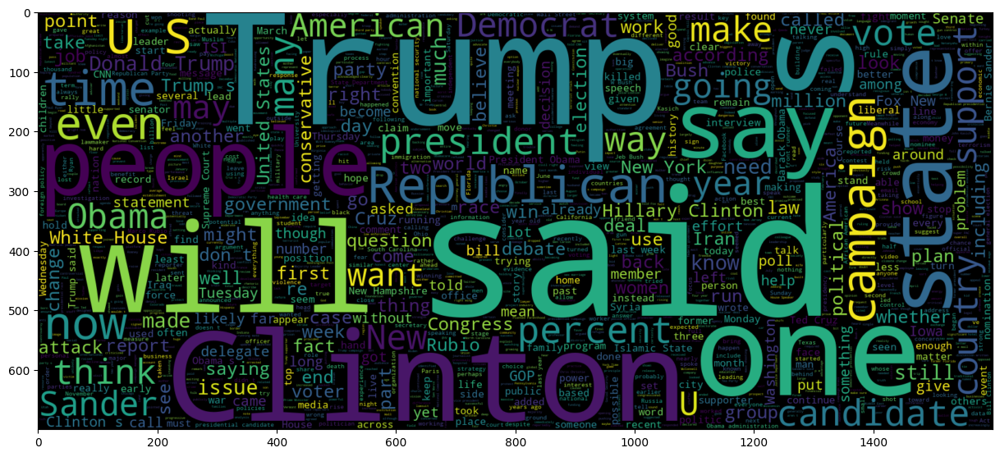

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset1[Dataset1.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

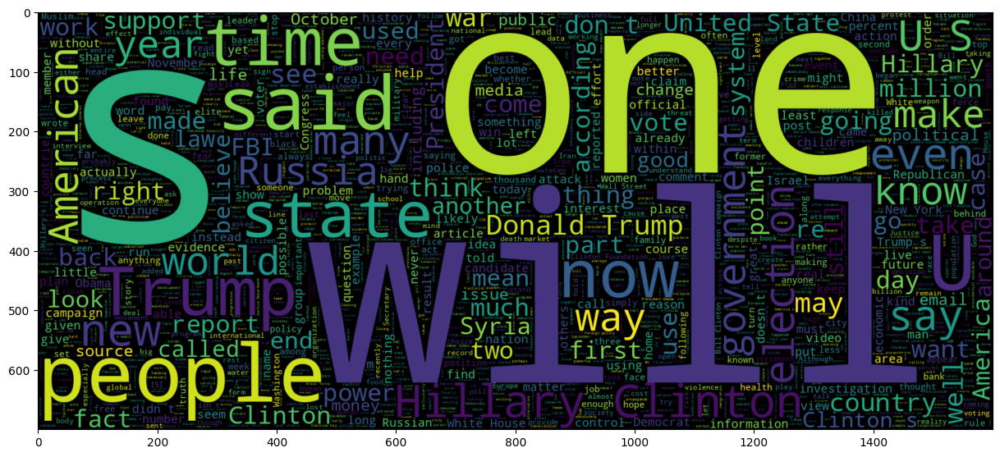

In [ ]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset1[Dataset1.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset2

In [ ]:
#Importing all required library
import nltk
import re
import string
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.tokenize import word_tokenize, sent_tokenize
from wordcloud import WordCloud, STOPWORDS
import transformers
from transformers import BertTokenizer, TFBertModel
import tensorflow as tf

In [ ]:
Dataset2_true = pd.read_csv("/content/True.csv")
Dataset2_fake = pd.read_csv("/content/Fake.csv")

In [ ]:
Dataset2_true.nunique()

,0
title,20826
text,21192
subject,2
date,716


In [ ]:
Dataset2_fake.nunique()

,0
title,17903
text,17455
subject,6
date,1681


In [ ]:
import pandas as pd

# Assuming Dataset2_true is a Pandas DataFrame with a column named 'subject'

# Load your data (replace with your actual data loading code)
# For example:
# Dataset2_true = pd.read_csv("your_data_file.csv")

# Check if the 'subject' column exists
if 'subject' not in Dataset2_true.columns:
    print("Error: 'subject' column not found in Dataset2_true.")
else:
    # Counting by Subjects in Real news
    subject_counts = Dataset2_true['subject'].value_counts() #More concise and readable

    for subject, count in subject_counts.items(): # Use items() to iterate
        print(f"{subject}:\t{count}")

    # Getting Total Rows
    total_records = Dataset2_true.shape[0] #More descriptive variable name
    print(f"Total Records:\t{total_records}")



politicsNews:	11272
worldnews:	10145
Total Records:	21417


In [ ]:
import pandas as pd

# Assuming Dataset2_fake is a Pandas DataFrame with a column named 'subject'

# Load your data (replace with your actual data loading code)
# For example:
# Dataset2_fake = pd.read_csv("your_data_file.csv")

# Check if the 'subject' column exists
if 'subject' not in Dataset2_fake.columns:
    print("Error: 'subject' column not found in Dataset2_fake.")
else:
    # Counting by Subjects in Fake news
    subject_counts = Dataset2_fake['subject'].value_counts() #More concise and readable

    for subject, count in subject_counts.items(): # Use items() to iterate
        print(f"{subject}:\t{count}")

    # Getting Total Rows
    total_records = Dataset2_fake.shape[0] #More descriptive variable name
    print(f"Total Records:\t{total_records}")

News:	9050
politics:	6841
left-news:	4459
Government News:	1570
US_News:	783
Middle-east:	778
Total Records:	23481


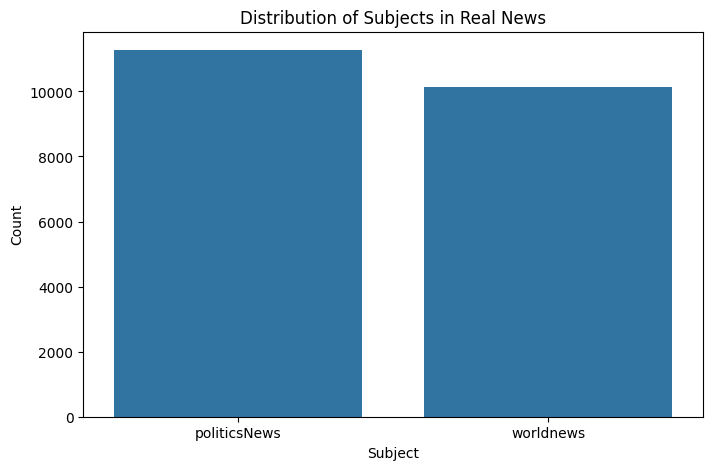

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming Dataset2_true is a Pandas DataFrame with a column named 'subject'

# Load your data (replace with your actual data loading code)
# For example:
# Dataset2_true = pd.read_csv("your_data_file.csv")

# Check if the 'subject' column exists
if 'subject' not in Dataset2_true.columns:
    print("Error: 'subject' column not found in Dataset2_true.")
else:
    # Plotting the Subjects in Real news
    plt.figure(figsize=(8, 5))  # Set figure size before creating the plot
    sns.countplot(x="subject", data=Dataset2_true) #Correct form for countplot. X axis will be "Subject".
    plt.title("Distribution of Subjects in Real News") #Added title
    plt.xlabel("Subject") #Label axis
    plt.ylabel("Count") # Label axis
    plt.show()

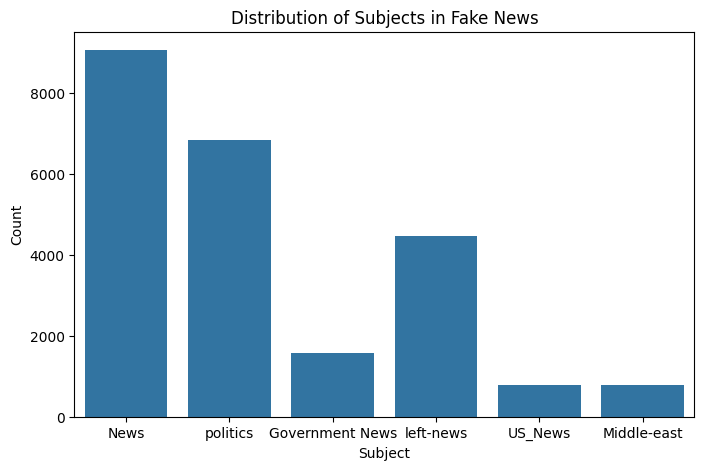

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming Dataset2_fake is a Pandas DataFrame with a column named 'subject'

# Load your data (replace with your actual data loading code)
# For example:
# Dataset2_fake = pd.read_csv("your_data_file.csv")

# Check if the 'subject' column exists
if 'subject' not in Dataset2_fake.columns:
    print("Error: 'subject' column not found in Dataset2_fake.")
else:
    # Plotting the Subjects in Fake news
    plt.figure(figsize=(8, 5))  # Set figure size before creating the plot
    sns.countplot(x="subject", data=Dataset2_fake) #Correct form for countplot. X axis will be "Subject".
    plt.title("Distribution of Subjects in Fake News") #Added title
    plt.xlabel("Subject") #Label axis
    plt.ylabel("Count") # Label axis
    plt.show()

In [ ]:
Dataset2_true['label']= 1
Dataset2_fake['label']= 0
Dataset2 = pd.concat([Dataset2_true, Dataset2_fake])
Dataset2["Article"] = Dataset2["title"] + Dataset2["text"]
Dataset2.sample(frac = 1) #Shuffle 100%
Dataset2 = Dataset2.loc[:,['Article','label']]

In [ ]:
Dataset2

,Article,label
0,"As U.S. budget fight looms, Republicans flip t...",1
1,U.S. military to accept transgender recruits o...,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,1
3,FBI Russia probe helped by Australian diplomat...,1
4,Trump wants Postal Service to charge 'much mor...,1
...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,0
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,0
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,0
23479,How to Blow $700 Million: Al Jazeera America F...,0


In [ ]:
##  Applying the wordpre method to the dataset
import re
import string

def wordpre(text):
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub("\\W"," ",text) # remove special chars
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)

    return text
Dataset2['Article']=Dataset2['Article'].apply(wordpre)

In [ ]:
Dataset2.head()

,Article,label
0,as u s budget fight looms republicans flip t...,1
1,u s military to accept transgender recruits o...,1
2,senior u s republican senator let mr muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much mor...,1


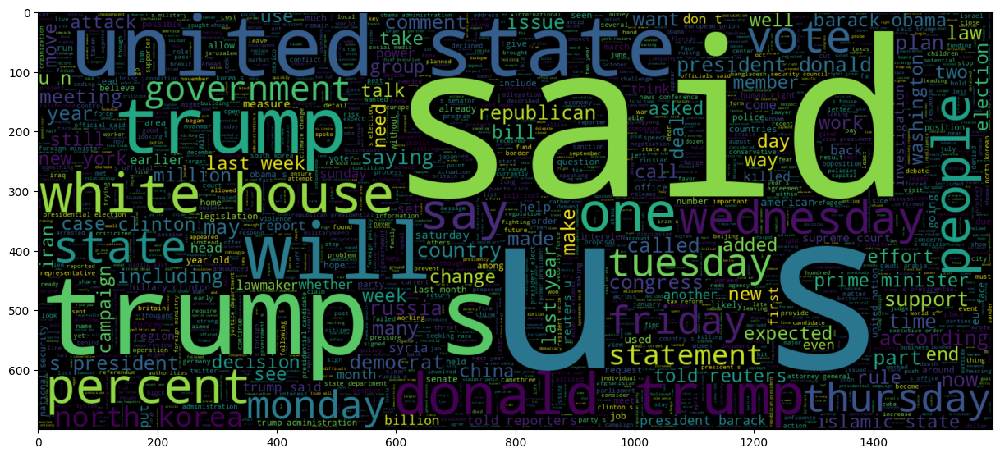

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset2[Dataset2.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

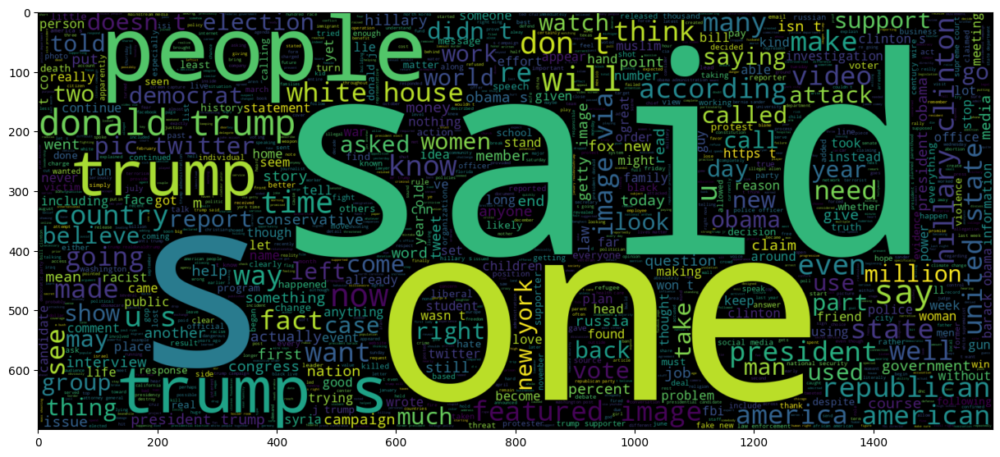

In [ ]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset2[Dataset2.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 3

In [ ]:
Dataset3_real = pd.read_csv("/content/politifact_real.csv")
Dataset3_fake = pd.read_csv("/content/politifact_fake.csv")

In [ ]:
Dataset3_real['label']= 1
Dataset3_fake['label']= 0
Dataset3 = pd.concat([Dataset3_real, Dataset3_fake])
Dataset3["Article"] = Dataset3["title"]
Dataset3.sample(frac = 1) #Shuffle 100%
Dataset3 = Dataset3.loc[:,['Article','label']]

In [ ]:
Dataset3

,Article,label
0,National Federation of Independent Business,1
1,comments in Fayetteville NC,1
2,"Romney makes pitch, hoping to close deal : Ele...",1
3,Democratic Leaders Say House Democrats Are Uni...,1
4,"Budget of the United States Government, FY 2008",1
...,...,...
427,Who is affected by the government shutdown?,0
428,Lindsey Graham Threatens To Convert To Democra...,0
429,ELECTORAL COLLEGE ELECTOR COMMITS SUICIDE TO A...,0
430,Sarah Palin Calls To Boycott Mall Of America B...,0


In [ ]:
##  Applying the wordpre method to the dataset
Dataset3['Article']=Dataset3['Article'].apply(wordpre)

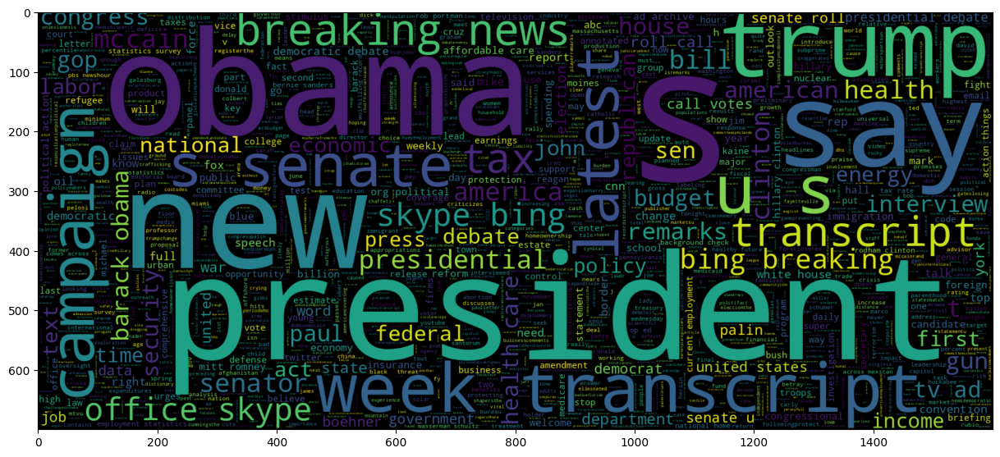

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset3[Dataset3.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

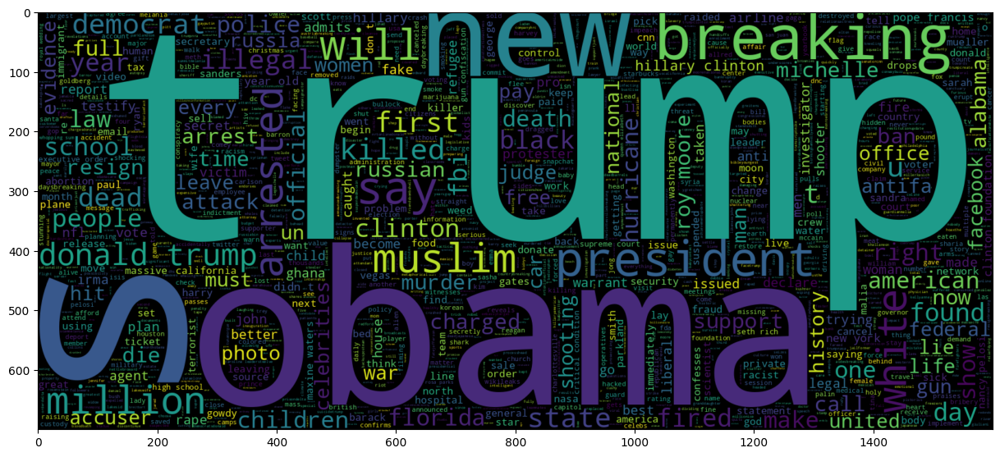

In [ ]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset3[Dataset3.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 4

In [ ]:
Dataset4 = pd.read_csv("/content/train.csv")

In [ ]:
Dataset4.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \r\nAn Iranian woman has been sentenced ...,1


In [ ]:
Dataset4["Article"] = Dataset4["title"] + Dataset4["text"]
Dataset4.sample(frac = 1) #Shuffle 100%

Dataset4 = Dataset4.loc[:,['Article','label']]
Dataset4 = Dataset4.dropna()

In [ ]:
##  Applying the wordpre method to the dataset
Dataset4['Article']=Dataset4['Article'].apply(wordpre)

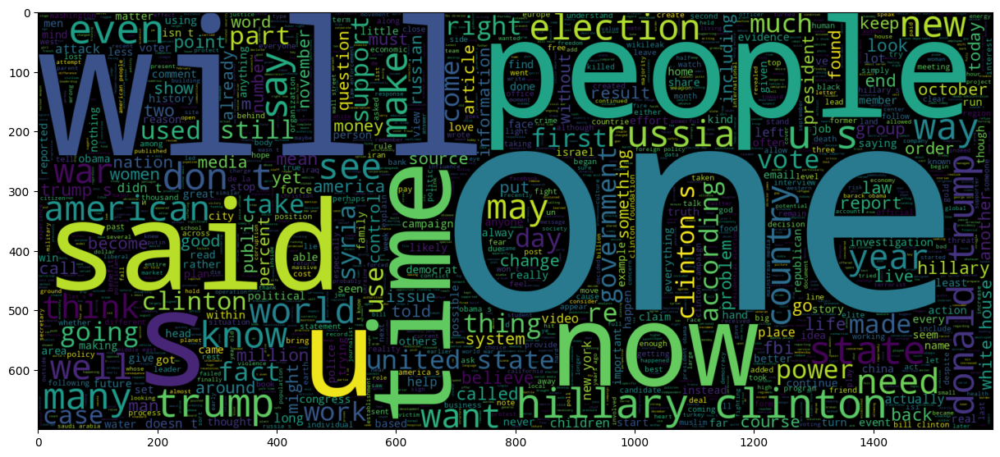

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset4[Dataset4.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

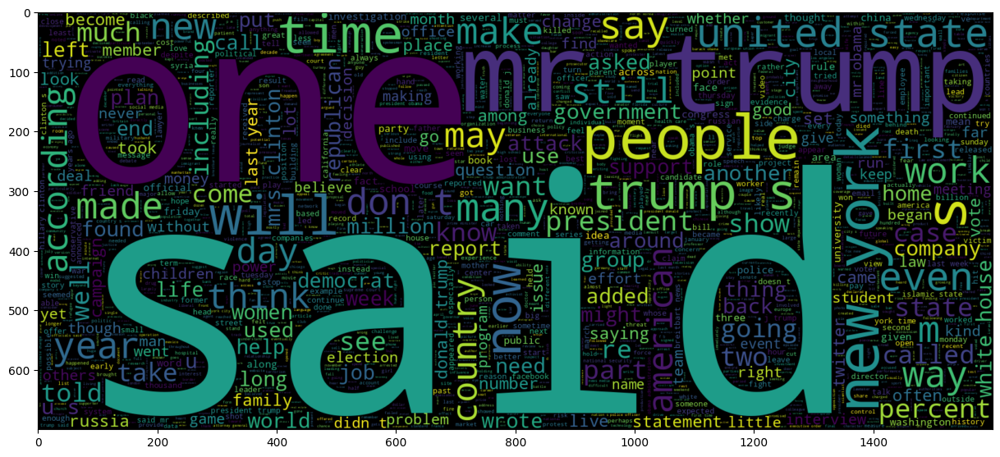

In [ ]:
#word used in Fake news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset4[Dataset4.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

# Dataset 5

In [ ]:
Dataset5 = pd.read_csv("/content/data.csv")

In [ ]:
Dataset5

,URLs,Headline,Body,Label
0,http://www.bbc.com/news/world-us-canada-414191...,Four ways Bob Corker skewered Donald Trump,Image copyright Getty Images\r\nOn Sunday morn...,1
1,https://www.reuters.com/article/us-filmfestiva...,Linklater's war veteran comedy speaks to moder...,"LONDON (Reuters) - “Last Flag Flying”, a comed...",1
2,https://www.nytimes.com/2017/10/09/us/politics...,Trump’s Fight With Corker Jeopardizes His Legi...,The feud broke into public view last week when...,1
3,https://www.reuters.com/article/us-mexico-oil-...,Egypt's Cheiron wins tie-up with Pemex for Mex...,MEXICO CITY (Reuters) - Egypt’s Cheiron Holdin...,1
4,http://www.cnn.com/videos/cnnmoney/2017/10/08/...,Jason Aldean opens 'SNL' with Vegas tribute,"Country singer Jason Aldean, who was performin...",1
...,...,...,...,...
4004,http://beforeitsnews.com/sports/2017/09/trends...,Trends to Watch,Trends to Watch\r\n% of readers think this sto...,0
4005,http://beforeitsnews.com/u-s-politics/2017/10/...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,Trump Jr. Is Soon To Give A 30-Minute Speech F...,0
4006,https://www.activistpost.com/2017/09/ron-paul-...,"Ron Paul on Trump, Anarchism & the AltRight",NaN,0
4007,https://www.reuters.com/article/us-china-pharm...,China to accept overseas trial data in bid to ...,SHANGHAI (Reuters) - China said it plans to ac...,1


In [ ]:
Dataset5["Article"] = Dataset5["Headline"] + Dataset5["Body"]
Dataset5["label"] = Dataset5["Label"]
Dataset5.sample(frac = 1) #Shuffle 100%
Dataset5 = Dataset5.loc[:,['Article','label']]
Dataset5 = Dataset5.dropna()

In [ ]:
##  Applying the wordpre method to the dataset
Dataset5['Article']=Dataset5['Article'].apply(wordpre)

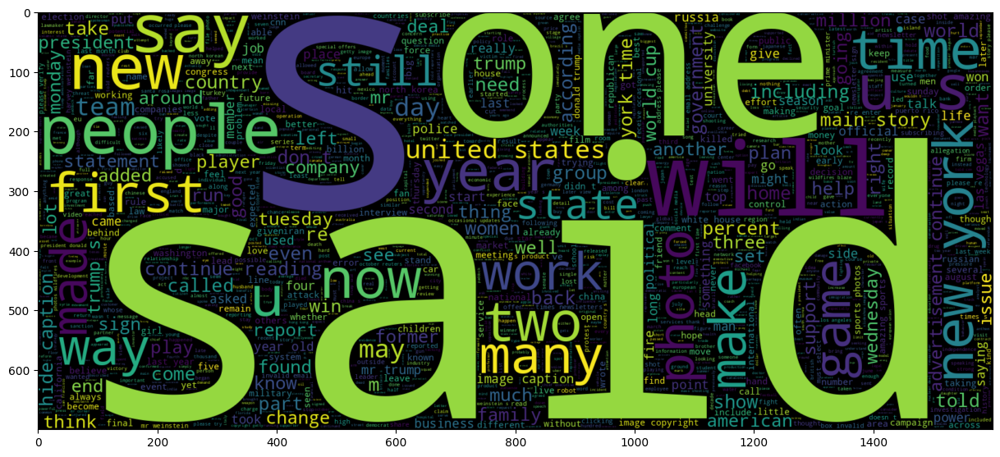

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset5[Dataset5.label== 1].Article))
plt.imshow(wc, interpolation="bilinear")

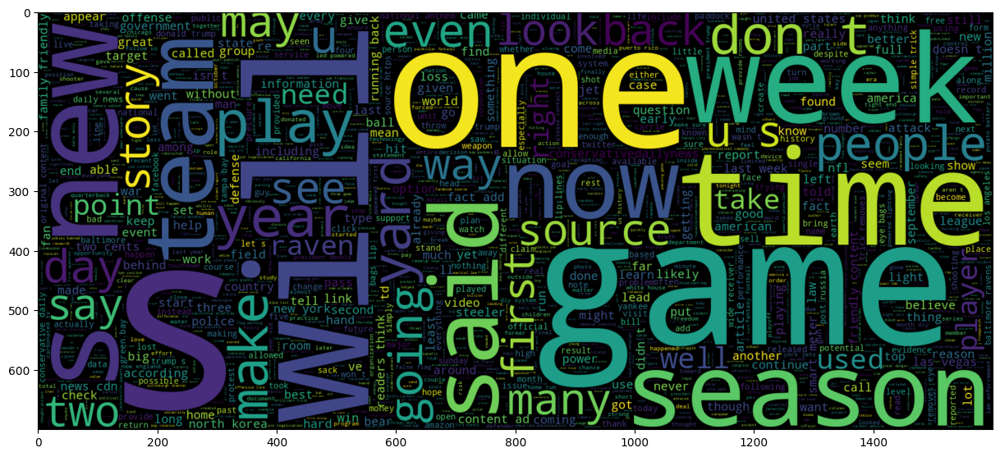

In [ ]:
#word used in Real news
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(Dataset5[Dataset5.label== 0].Article))
plt.imshow(wc, interpolation="bilinear")

In [ ]:
#combining all the datset into one
frames = [Dataset2, Dataset3, Dataset4,Dataset5]
Dataset = pd.concat(frames)

In [ ]:
Dataset.shape

(70145, 2)

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(Dataset['Article'], Dataset['label'], test_size=0.2, random_state=2020)

In [ ]:
x_train.shape

(56116,)

In [ ]:
x_test.shape

(14029,)

In [ ]:
y_train=y_train.astype('int')
y_test=y_test.astype('int')

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.linear_model import LogisticRegression  # Import LogisticRegression
from sklearn.metrics import accuracy_score

# Example usage (assuming x_train, y_train, x_test, y_test are already defined)

pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', LogisticRegression())])

Logisticmodel = pipe.fit(x_train, y_train)
prediction = Logisticmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Logisticmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

accuracy: 91.52%


In [ ]:
#####DecisionTreeClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', DecisionTreeClassifier(criterion= 'entropy',
                                           max_depth = 10,
                                           splitter='best',
                                           random_state=2020))])
DecisionTreemodel = pipe.fit(x_train, y_train)
prediction = DecisionTreemodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
DecisionTreemodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-56-92d0e71149e1>", line 8, in <cell line: 0>
    DecisionTreemodel = pipe.fit(x_train, y_train)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py", line 654, in fit
    Xt = self._fit(X, y, routed_params, raw_params=params)
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py", line 588, in _fit
    X, fitted_transformer = fit_transform_one_cached(
                            ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-package

In [ ]:
#####RandomForestClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', RandomForestClassifier())])

RandomForestmodel = pipe.fit(x_train, y_train)
prediction = RandomForestmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
RandomForestmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

KeyboardInterrupt: 

In [ ]:
#Stochastic Gradient Descent
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', SGDClassifier())])
SGDmodel = pipe.fit(x_train, y_train)
prediction = SGDmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
SDGmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

In [ ]:
#GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', GradientBoostingClassifier(loss = 'deviance',
                                                   learning_rate = 0.01,
                                                   n_estimators = 10,
                                                   max_depth = 5,
                                                   random_state=55))])

GBCmodel = pipe.fit(x_train, y_train)
prediction = GBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
GBCmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

In [ ]:
#########XGBClassifier
from xgboost import XGBClassifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', XGBClassifier(loss = 'deviance',
                                                   learning_rate = 0.01,
                                                   n_estimators = 10,
                                                   max_depth = 5,
                                                   random_state=2020))])

xgboostmodel = pipe.fit(x_train, y_train)
prediction = xgboostmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
xgboostmodel_accuracy = round(accuracy_score(y_test, prediction)*100,2)

In [ ]:
#######Multinomial Naive Bayes Classifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', MultinomialNB())])

MNBCmodel = pipe.fit(x_train, y_train)
prediction = MNBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Multinomial_Naive_Bayes_accuracy = round(accuracy_score(y_test, prediction)*100,2)

In [ ]:
#############Bernoulli Naive Bayes Classifier
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', BernoulliNB())])

BNBCmodel = pipe.fit(x_train, y_train)
prediction = BNBCmodel.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))
Bernoulli_Naive_Bayes_accuracy = round(accuracy_score(y_test, prediction)*100,2)

In [ ]:
x = ["SDGmodel_accuracy", "Logisticmodel_accuracy", "GBCmodel_accuracy", "xgboostmodel_accuracy" ,
     "DecisionTreemodel_accuracy","RandomForestmodel_accuracy","Multinomial_Naive_Bayes_accuracy",
     "Bernoulli_Naive_Bayes_accuracy"]
y =  [SDGmodel_accuracy,Logisticmodel_accuracy,GBCmodel_accuracy,xgboostmodel_accuracy,
      DecisionTreemodel_accuracy,RandomForestmodel_accuracy,Multinomial_Naive_Bayes_accuracy,
      Bernoulli_Naive_Bayes_accuracy]
plt.barh(x, y)

for index, value in enumerate(y):
    plt.text(value, index, str(value))

In [ ]:
import joblib
# Save the model as a pickle in a file
joblib.dump(Logisticmodel, 'model.pkl')